# Text Classification in Cross-Validation using MLP Algorithm

## Import Libraries

In [1]:
import re
import unicodedata
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from lime import lime_text
from sklearn import metrics
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize 
from sklearn.pipeline import make_pipeline
from nltk.stem.snowball import SnowballStemmer
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer

from sklearn.neural_network import MLPClassifier

## Set Hyparameters

In [2]:
hidden_layer_sizes=[128,128]
activation='relu'
optimizer='adam'
alpha=0.001
lr="constant"

nfold=10

number_of_feature = 3000

dataset_path = "../input/politica/politica.xlsx"

## Load Dataset

In [3]:
df = pd.read_excel(dataset_path, sheet_name="Foglio1")
print(f'Found {len(df)} texts.')

print(f'{df["cap_maj_master"].isnull().sum()} document(s) with no classification removed')
df=df[pd.notnull(df['cap_maj_master'])]

print(f'{df["testo"].isnull().sum()} document(s) with no text removed')
df=df[pd.notnull(df['testo'])]

classes = [int(c) for c in df['cap_maj_master']]
documents = [d for d in df['testo']]

###### Print dataset ###################
df = df[['cap_maj_master', 'testo']]
df.columns = ['sentiment', 'review']
df.head(3)

Found 5674 texts.
2 document(s) with no classification removed
424 document(s) with no text removed


,sentiment,review
0,1.0,: quali siano le determinazioni del Governo in...
1,1.0,: quali siano le valutazioni del Governo sugli...
2,1.0,- premesso che: la prospettata modifica degli ...


## Class Distribution Diagram

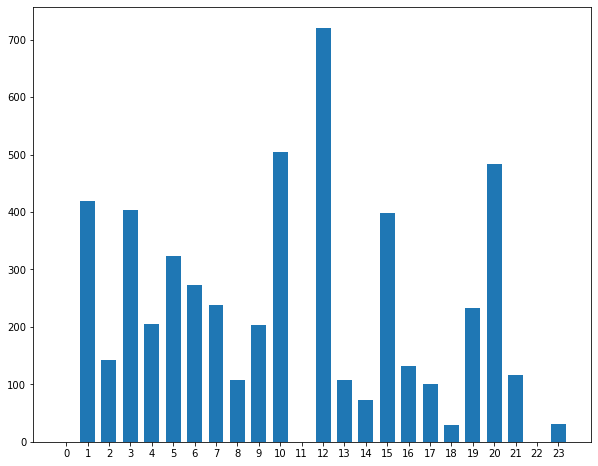

In [4]:
y = np.bincount(classes)
x = np.arange(len(y))
fig, ax = plt.subplots(figsize=(10,8))
plt.bar(x, y,width=0.7)
ax.set_xticks(x)
ax.set_aspect('auto')
plt.show()

## Define Preprocessor

In [5]:
def preprocessor(text):
    text = re.sub('<[^>]*>', ' ', str(text))
    text=re.sub('\d+',' ',str(text))
    text=re.sub('[ﾫﾻ]','',str(text))
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)',
                           str(text))
    text = (re.sub('[\W]+', ' ', text.lower()) + ' ' +
            ' '.join(emoticons).replace('-', ''))
    return text

def strip_accents(text):
    
    try:
        text = unicode(text, 'utf-8')
    except (TypeError, NameError): # unicode is a default on python 3 
        pass
    text = unicodedata.normalize('NFD', text)
    text = text.encode('ascii', 'ignore')
    text = text.decode("utf-8")
    return str(text)

stop=set(stopwords.words('italian'))

def tokenizer_porter(text):
    word_tokens = word_tokenize(text)
    stemmer = SnowballStemmer("italian", ignore_stopwords=True)
    return [stemmer.stem(word) for word in word_tokens]

## Define Infogain Function

In [6]:
def information_gain(X, y):

    def _calIg():
        entropy_x_set = 0
        entropy_x_not_set = 0
        for c in classCnt:
            probs = classCnt[c] / float(featureTot)
            entropy_x_set = entropy_x_set - probs * np.log(probs)
            probs = (classTotCnt[c] - classCnt[c]) / float(tot - featureTot)
            entropy_x_not_set = entropy_x_not_set - probs * np.log(probs)
        for c in classTotCnt:
            if c not in classCnt:
                probs = classTotCnt[c] / float(tot - featureTot)
                entropy_x_not_set = entropy_x_not_set - probs * np.log(probs)
        return entropy_before - ((featureTot / float(tot)) * entropy_x_set
                             +  ((tot - featureTot) / float(tot)) * entropy_x_not_set)

    tot = X.shape[0]
    classTotCnt = {}
    entropy_before = 0
    for i in y:
        if i not in classTotCnt:
            classTotCnt[i] = 1
        else:
            classTotCnt[i] = classTotCnt[i] + 1
    for c in classTotCnt:
        probs = classTotCnt[c] / float(tot)
        entropy_before = entropy_before - probs * np.log(probs)

    nz = X.T.nonzero()
    pre = 0
    classCnt = {}
    featureTot = 0
    information_gain = []
    for i in range(0, len(nz[0])):
        if (i != 0 and nz[0][i] != pre):
            for notappear in range(pre+1, nz[0][i]):
                information_gain.append(0)
            ig = _calIg()
            information_gain.append(ig)
            pre = nz[0][i]
            classCnt = {}
            featureTot = 0
        featureTot = featureTot + 1
        yclass = y[nz[1][i]]
        if yclass not in classCnt:
            classCnt[yclass] = 1
        else:
            classCnt[yclass] = classCnt[yclass] + 1
    ig = _calIg()
    information_gain.append(ig)

    return np.asarray(information_gain)

#https://stackoverflow.com/questions/25462407/fast-information-gain-computation

## Cross-Validation Pipeline

Feature trovati: 8432
Feature usati: 3000
--------------- Fold:  1 ---------------------

Accuracy: 0.71
Detail:
              precision    recall  f1-score   support

           1       0.54      0.69      0.60        42
           2       0.53      0.53      0.53        15
           3       0.79      0.75      0.77        40
           4       1.00      0.95      0.98        21
           5       0.67      0.69      0.68        32
           6       0.88      0.81      0.85        27
           7       0.88      0.88      0.88        24
           8       0.70      0.64      0.67        11
           9       0.60      0.60      0.60        20
          10       0.80      0.90      0.85        50
          12       0.76      0.74      0.75        73
          13       0.83      0.45      0.59        11
          14       1.00      0.71      0.83         7
          15       0.61      0.62      0.62        40
          16       0.64      0.54      0.58        13
          17       0.7

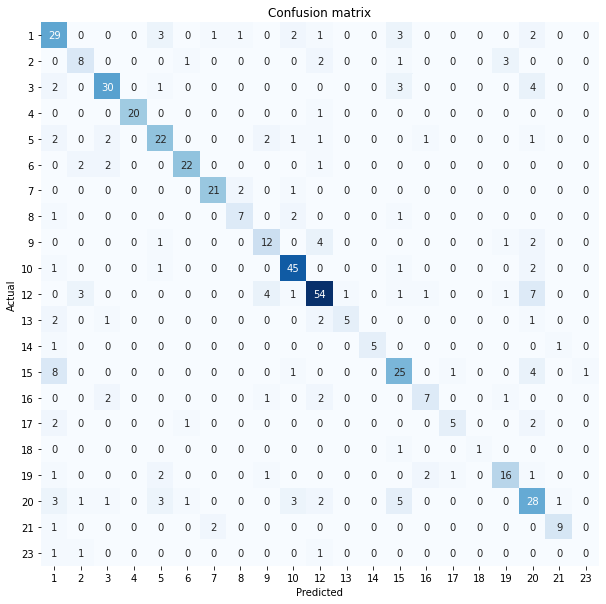

True: 1 --> Pred: 1 | Prob: 1.0


Feature trovati: 8461
Feature usati: 3000
--------------- Fold:  2 ---------------------

Accuracy: 0.7
Detail:
              precision    recall  f1-score   support

           1       0.52      0.40      0.45        42
           2       0.62      0.67      0.65        15
           3       0.75      0.82      0.79        40
           4       0.78      0.86      0.82        21
           5       0.53      0.56      0.55        32
           6       0.85      0.85      0.85        27
           7       0.95      0.79      0.86        24
           8       0.64      0.82      0.72        11
           9       0.62      0.65      0.63        20
          10       0.83      0.80      0.82        50
          12       0.72      0.85      0.78        72
          13       0.73      0.73      0.73        11
          14       0.71      0.71      0.71         7
          15       0.58      0.47      0.52        40
          16       0.79      0.85      0.81        13
          17       0.58

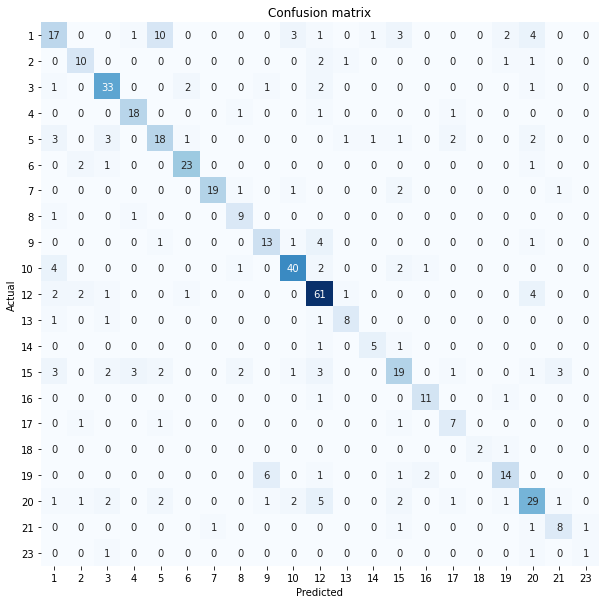

True: 15 --> Pred: 21 | Prob: 0.35


Feature trovati: 8456
Feature usati: 3000
--------------- Fold:  3 ---------------------

Accuracy: 0.65
Detail:
              precision    recall  f1-score   support

           1       0.46      0.55      0.50        42
           2       0.58      0.47      0.52        15
           3       0.76      0.80      0.78        40
           4       0.88      0.75      0.81        20
           5       0.69      0.73      0.71        33
           6       0.83      0.86      0.84        28
           7       0.71      0.50      0.59        24
           8       0.54      0.64      0.58        11
           9       0.75      0.60      0.67        20
          10       0.80      0.80      0.80        50
          12       0.68      0.79      0.73        72
          13       0.50      0.55      0.52        11
          14       0.75      0.43      0.55         7
          15       0.45      0.50      0.48        40
          16       0.89      0.62      0.73        13
          17       0.8

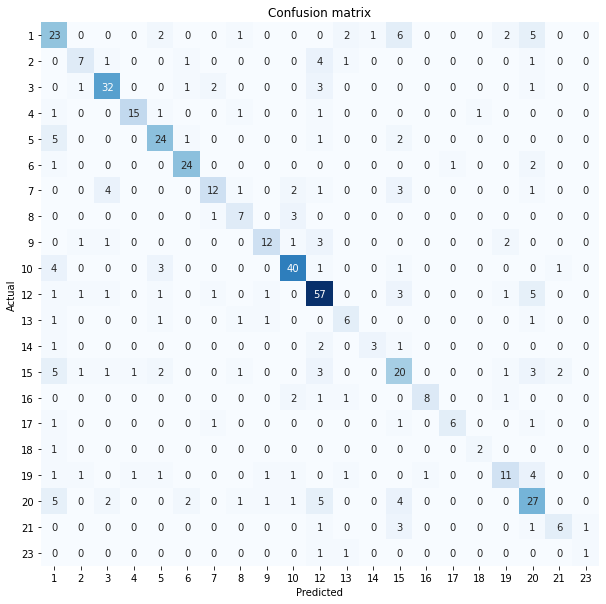

True: 1 --> Pred: 1 | Prob: 0.98


Feature trovati: 8458
Feature usati: 3000
--------------- Fold:  4 ---------------------

Accuracy: 0.65
Detail:
              precision    recall  f1-score   support

           1       0.50      0.50      0.50        42
           2       0.88      0.50      0.64        14
           3       0.76      0.80      0.78        40
           4       0.72      0.65      0.68        20
           5       0.63      0.73      0.68        33
           6       0.86      0.86      0.86        28
           7       0.62      0.67      0.64        24
           8       0.82      0.82      0.82        11
           9       0.61      0.70      0.65        20
          10       0.87      0.82      0.85        50
          12       0.68      0.72      0.70        72
          13       0.33      0.27      0.30        11
          14       0.33      0.29      0.31         7
          15       0.50      0.47      0.49        40
          16       0.75      0.69      0.72        13
          17       0.6

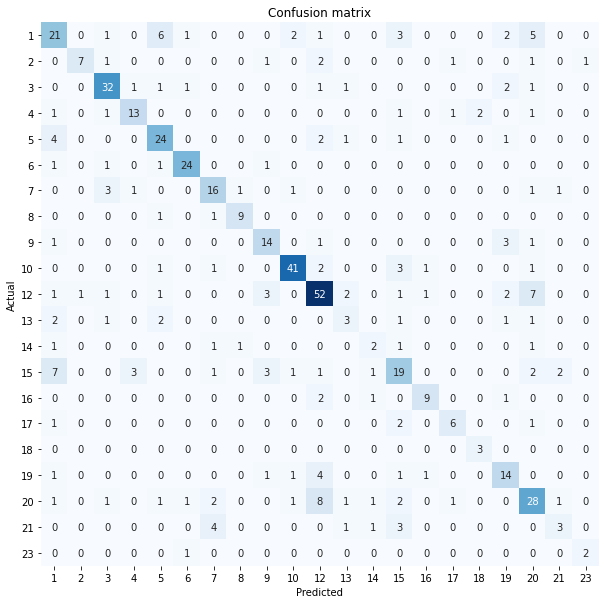

True: 1 --> Pred: 12 | Prob: 1.0


Feature trovati: 8472
Feature usati: 3000
--------------- Fold:  5 ---------------------

Accuracy: 0.66
Detail:
              precision    recall  f1-score   support

           1       0.63      0.57      0.60        42
           2       0.38      0.43      0.40        14
           3       0.89      0.82      0.86        40
           4       0.67      0.70      0.68        20
           5       0.67      0.73      0.70        33
           6       0.75      0.86      0.80        28
           7       0.75      0.65      0.70        23
           8       0.69      0.82      0.75        11
           9       0.65      0.65      0.65        20
          10       0.81      0.96      0.88        50
          12       0.70      0.69      0.70        72
          13       0.78      0.64      0.70        11
          14       0.75      0.43      0.55         7
          15       0.45      0.53      0.48        40
          16       0.80      0.57      0.67        14
          17       0.6

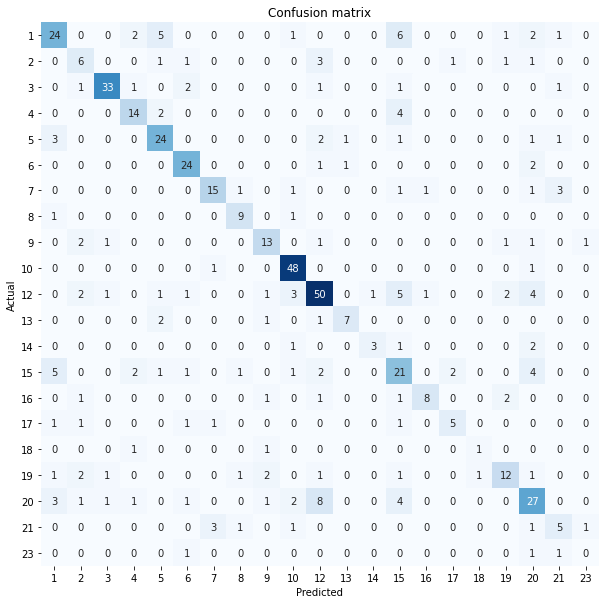

True: 1 --> Pred: 1 | Prob: 0.98


Feature trovati: 8468
Feature usati: 3000
--------------- Fold:  6 ---------------------

Accuracy: 0.65
Detail:
              precision    recall  f1-score   support

           1       0.48      0.69      0.57        42
           2       0.42      0.36      0.38        14
           3       0.86      0.90      0.88        40
           4       0.94      0.80      0.86        20
           5       0.55      0.55      0.55        33
           6       0.74      0.85      0.79        27
           7       0.70      0.58      0.64        24
           8       0.82      0.82      0.82        11
           9       0.64      0.70      0.67        20
          10       0.80      0.88      0.84        51
          12       0.71      0.68      0.70        72
          13       0.44      0.36      0.40        11
          14       0.67      0.57      0.62         7
          15       0.60      0.45      0.51        40
          16       0.56      0.36      0.43        14
          17       0.6

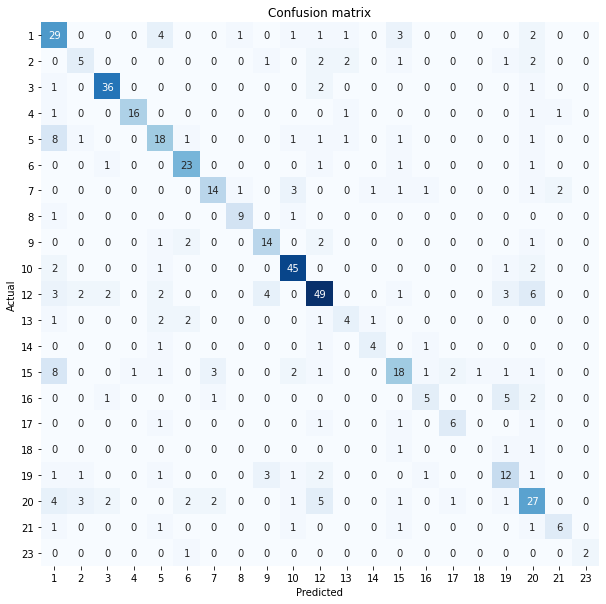

True: 1 --> Pred: 1 | Prob: 1.0


Feature trovati: 8399
Feature usati: 3000
--------------- Fold:  7 ---------------------

Accuracy: 0.68
Detail:
              precision    recall  f1-score   support

           1       0.53      0.60      0.56        42
           2       0.64      0.64      0.64        14
           3       0.84      0.88      0.86        41
           4       0.76      0.80      0.78        20
           5       0.67      0.69      0.68        32
           6       0.81      0.78      0.79        27
           7       0.75      0.75      0.75        24
           8       1.00      0.82      0.90        11
           9       1.00      0.71      0.83        21
          10       0.76      0.86      0.81        51
          12       0.65      0.74      0.69        72
          13       0.62      0.45      0.53        11
          14       0.50      0.57      0.53         7
          15       0.36      0.36      0.36        39
          16       0.82      0.69      0.75        13
          17       0.8

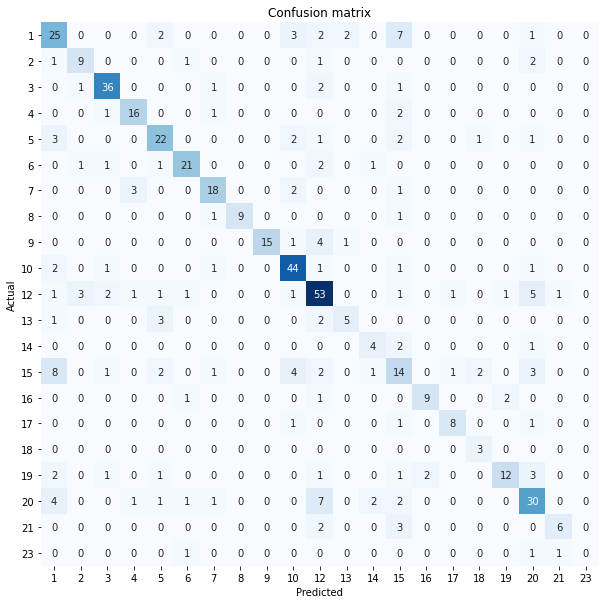

True: 12 --> Pred: 12 | Prob: 0.2


Feature trovati: 8469
Feature usati: 3000
--------------- Fold:  8 ---------------------

Accuracy: 0.7
Detail:
              precision    recall  f1-score   support

           1       0.53      0.64      0.58        42
           2       0.75      0.43      0.55        14
           3       0.88      0.88      0.88        41
           4       0.86      0.90      0.88        21
           5       0.74      0.62      0.68        32
           6       0.83      0.70      0.76        27
           7       0.64      0.88      0.74        24
           8       0.67      0.40      0.50        10
           9       0.79      0.90      0.84        21
          10       0.82      0.78      0.80        51
          12       0.76      0.82      0.79        72
          13       0.70      0.70      0.70        10
          14       1.00      0.38      0.55         8
          15       0.51      0.47      0.49        40
          16       1.00      0.77      0.87        13
          17       0.78

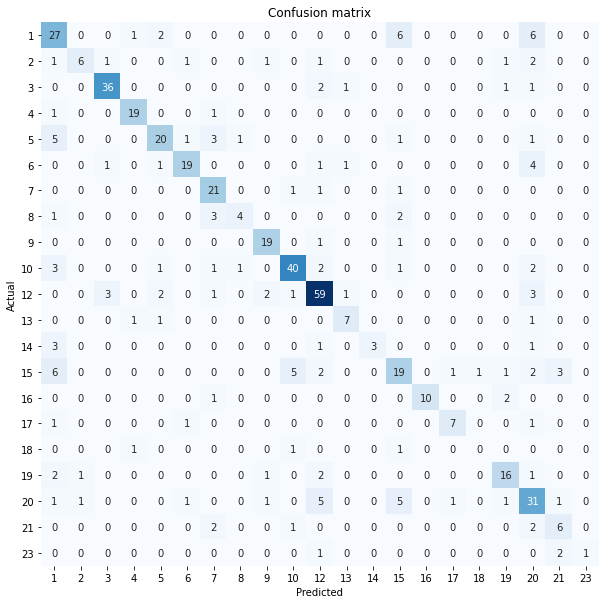

True: 1 --> Pred: 1 | Prob: 0.99


Feature trovati: 8435
Feature usati: 3000
--------------- Fold:  9 ---------------------

Accuracy: 0.71
Detail:
              precision    recall  f1-score   support

           1       0.52      0.67      0.58        42
           2       0.86      0.43      0.57        14
           3       0.84      0.90      0.87        41
           4       0.86      0.86      0.86        21
           5       0.73      0.69      0.71        32
           6       0.89      0.89      0.89        27
           7       0.72      0.75      0.73        24
           8       0.80      0.80      0.80        10
           9       0.94      0.76      0.84        21
          10       0.81      0.82      0.82        51
          12       0.76      0.86      0.81        72
          13       0.33      0.20      0.25        10
          14       0.60      0.75      0.67         8
          15       0.59      0.47      0.53        40
          16       0.75      0.69      0.72        13
          17       0.8

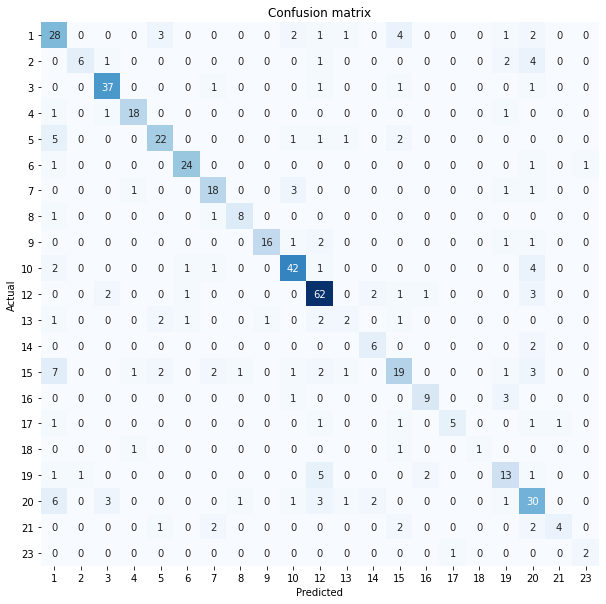

True: 1 --> Pred: 19 | Prob: 0.79


Feature trovati: 8425
Feature usati: 3000
--------------- Fold: 10 ---------------------

Accuracy: 0.71
Detail:
              precision    recall  f1-score   support

           1       0.67      0.69      0.68        42
           2       0.58      0.50      0.54        14
           3       0.85      0.88      0.86        40
           4       0.88      0.71      0.79        21
           5       0.82      0.72      0.77        32
           6       0.88      0.81      0.85        27
           7       0.77      0.71      0.74        24
           8       0.86      0.60      0.71        10
           9       0.67      0.90      0.77        20
          10       0.84      0.80      0.82        51
          12       0.71      0.78      0.74        72
          13       0.56      0.50      0.53        10
          14       0.83      0.62      0.71         8
          15       0.50      0.60      0.55        40
          16       0.62      0.77      0.69        13
          17       0.7

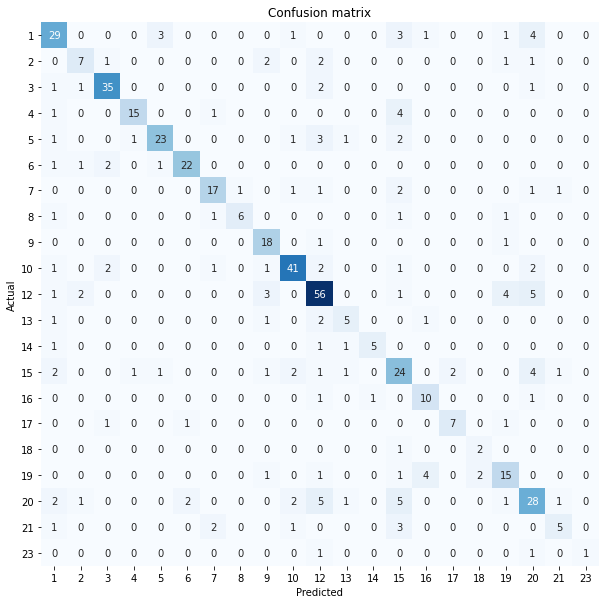

True: 1 --> Pred: 1 | Prob: 1.0


In [7]:
####### Setting up Cross-Validation #####
X=np.array(documents)
y=np.array(classes)
kfold = StratifiedKFold(n_splits=nfold,shuffle=True,random_state=1).split(X, y)

####### Define Variables for Metrics #####
accuracys = []
scores= []
metriche = np.zeros((nfold,4,len(np.unique(classes))))
target_names=list(map(str,np.unique(classes)))

####### Cross-Validation Loop ############

for k, (train, test) in enumerate(kfold):
    
   ########## Start Features Selection Procedure #########
    
    tfidf = TfidfVectorizer(strip_accents=strip_accents,
                        lowercase=False,
                        preprocessor=preprocessor,
                        tokenizer=tokenizer_porter,
                        stop_words=stop,
                        min_df = 4
                       )

    final_features = tfidf.fit_transform(X[train])
    print("Feature trovati:",final_features.toarray().shape[1])
    
    X_names=tfidf.get_feature_names()
    
    dtf_features = pd.DataFrame()
    IG_score = information_gain(final_features, y[train])
    dtf_features = dtf_features.append(pd.DataFrame({"feature":X_names, "IG_score":IG_score}))
    dtf_features = dtf_features.sort_values(["IG_score"], ascending=[False])
    dtf_features = dtf_features.head(number_of_feature)
    X_names = dtf_features["feature"].unique().tolist()

    
    tfidf = TfidfVectorizer(strip_accents=strip_accents,
                        lowercase=False,
                        preprocessor=preprocessor,
                        tokenizer=tokenizer_porter,
                        stop_words=stop,
                        min_df = 4,
                        vocabulary=X_names
                       )

    final_features = tfidf.fit_transform(X[train])
    
    print("Feature usati:",final_features.toarray().shape[1])
    
   ########## End Features Selection Procedure #########

   ########## Define Pipeline ########
    
    pipe_lr = make_pipeline(
                        tfidf,
                        MLPClassifier
                            (
                                hidden_layer_sizes=hidden_layer_sizes, 
                                activation=activation, 
                                solver=optimizer, 
                                alpha=alpha, 
                                learning_rate=lr)
                        )
    
   #######################################

    pipe_lr.fit(X[train], y[train])
    y_pred=pipe_lr.predict(X[test])
    y_prob=pipe_lr.predict_proba(X[test])

    
    ####### Compute Accuracy ##########
    accuracy = pipe_lr.score(X[test], y[test])
    accuracys.append(accuracy)
    
    ####### Compute Precision,Recall,F-Score ############
    score=precision_recall_fscore_support(y_true=y[test], y_pred=y_pred, average="weighted")
    scores.append(score[0:3])
    
    print('--------------- Fold: %2d ---------------------'% (k+1))
    print()
    print("Accuracy:",  round(accuracy,2))
    print("Detail:")
    print(metrics.classification_report(y[test], y_pred))
    
    dizionario=metrics.classification_report(y[test], y_pred, target_names=target_names,output_dict=True)
    for k_d,(m_id, m_info) in enumerate(dizionario.items()):
        if k_d<len(np.unique(classes)):
            for j_d,key in enumerate(m_info):
                metriche[k,j_d,k_d]=m_info[key]
        else:
            break
    
    ## Plot confusion matrix
    conf_mat = confusion_matrix(y[test], y_pred)
    fig, ax = plt.subplots(figsize=(10,10))
    sns.heatmap(conf_mat, annot=True, fmt='d', ax=ax, cbar=False,cmap=plt.cm.Blues)
    ax.set(xlabel="Predicted", ylabel="Actual", xticklabels=target_names, 
           yticklabels=target_names, title="Confusion matrix")
    plt.yticks(rotation=0)
    
    print()
    
    plt.show()
    
    ## select observation
    i = 0
    txt_instance = X[test][i]
    ## check true value and predicted value
    print("True:", y[test][i], "--> Pred:", y_pred[i], "| Prob:", round(np.max(y_prob[i]),2))
    ## show explanation
    explainer = lime_text.LimeTextExplainer(class_names=target_names)
    explained = explainer.explain_instance(txt_instance, 
                 pipe_lr.predict_proba, num_features=6,top_labels=2)
    explained.show_in_notebook(text=txt_instance, predict_proba=False)

    
arr = np.array(scores)

## Results Output

In [8]:
print("Overall results of the cross-validation procedure")
print()
print("Level 1")
print()

print('\nCV accuracy: %.2f +/- %.2f max: %.2f' % (np.mean(accuracys)*100, np.std(accuracys)*100,np.max(accuracys)*100))
print('\nCV precision: %.2f +/- %.2f max: %.2f' % (np.mean(arr[:,0])*100, np.std(arr[:,0])*100,np.max(arr[:,0])*100))
print('\nCV recall: %.2f +/- %.2f max: %.2f' % (np.mean(arr[:,1])*100, np.std(arr[:,1])*100,np.max(arr[:,1])*100))
print('\nCV f1: %.2f +/- %.2f max: %.2f' % (np.mean(arr[:,2])*100, np.std(arr[:,2])*100,np.max(arr[:,2])*100))

print()
print("Level 2")
print()
print(f"{'Class':^7} | {'precision':^9}{'':^6} | {'recall':^10}{'':^5} | {'f1-measure':^6}{'':^5} | {'support':^9}")
for i in range(len(np.unique(classes))):
    print(f"{i :^7} | {np.mean(metriche[:,0,i])*100:^5.2f} +/-{np.std(metriche[:,0,i])*100:^6.2f} | {np.mean(metriche[:,1,i])*100:^5.2f} +/-{np.std(metriche[:,1,i])*100:^6.2f} | {np.mean(metriche[:,2,i])*100:^5.2f} +/-{np.std(metriche[:,2,i])*100:^6.2f} | {np.mean(metriche[:,3,i]):^9.2f}")

Overall results of the cross-validation procedure

Level 1


CV accuracy: 68.29 +/- 2.40 max: 70.99

CV precision: 68.83 +/- 2.61 max: 71.82

CV recall: 68.29 +/- 2.40 max: 70.99

CV f1: 68.07 +/- 2.40 max: 70.82

Level 2

 Class  | precision       |   recall        | f1-measure      |  support 
   0    | 53.81 +/- 6.24  | 60.00 +/- 9.09  | 56.34 +/- 6.17  |   42.00  
   1    | 62.42 +/-15.81  | 49.52 +/- 9.27  | 54.16 +/- 8.73  |   14.30  
   2    | 82.22 +/- 4.93  | 84.34 +/- 4.82  | 83.21 +/- 4.41  |   40.30  
   3    | 83.60 +/- 9.67  | 79.86 +/- 9.11  | 81.47 +/- 8.44  |   20.50  
   4    | 66.88 +/- 8.30  | 66.96 +/- 6.50  | 66.77 +/- 6.64  |   32.40  
   5    | 83.11 +/- 4.93  | 82.75 +/- 5.07  | 82.78 +/- 3.72  |   27.30  
   6    | 74.75 +/- 9.62  | 71.52 +/-11.38  | 72.59 +/- 8.84  |   23.90  
   7    | 75.34 +/-12.44  | 71.64 +/-13.61  | 72.62 +/-11.35  |   10.70  
   8    | 72.64 +/-13.59  | 71.81 +/-10.38  | 71.54 +/- 9.07  |   20.30  
   9    | 81.46 +/- 2.80  | 84.37 +/-